# Tool Functions

In [107]:
import os, re, pathlib, requests,json


def dump(filename, pyList):
    with open(filename, 'w',encoding='utf-8') as file:
        json.dump(pyList, file,indent=2,ensure_ascii=False)

def del_x(idioms_l):
    remove_x=[]
    for i in idioms_l:
        if i!='x':
            remove_x.append(i)
    return remove_x

def load(filename):
    idiom_list=[]
    with open(filename, 'r',encoding='utf-8') as file:
        idiom_list = json.load(file)
    return idiom_list
Decriptions = load('Idioms/Description.json')
idioms = load('Idioms/Idioms.json')
print(idioms[3])
# dump("demo.json",demo)

a big fish in a small pond


In [136]:
import pathlib
import re
import requests

def save_generated_image(output: str, filename: str, *, show: bool = True) -> str:
    filename = re.sub(r'[^a-zA-Z0-9._-]+', '-', filename).strip('-')
    if not filename.lower().endswith(('.png', '.jpg', '.jpeg', '.webp', '.gif')):
        filename += '.jpg'

    urls = re.findall(r'https://\S+', output)
    if not urls:
        raise ValueError("No https URL found in output.")
    url = urls[1] if len(urls) > 1 else urls[0]

    dst_dir = pathlib.Path("img")
    dst_dir.mkdir(exist_ok=True)
    path = dst_dir / filename

    with requests.get(url, stream=True, timeout=60) as response:
        response.raise_for_status()
        with open(path, "wb") as file:
            for chunk in response.iter_content(1 << 14):
                if chunk:
                    file.write(chunk)

    if show:
        try:
            from IPython.display import display, Image
            display(Image(filename=str(path), width=300))
        except ImportError:
            pass

    return str(path)

# Framework

## (0) Prompts

In [143]:
poe_key ="bNT4xyGxnwNPlu5tkT1jzer-uU-OwBUI6DKXLo5Yf7M"
Idiom_2_Description_Prompt="""
Task: Generate image descriptions for text-to-image models that visually represent idioms without explicitly stating them.
Requirements:
Style: Cartoon/comic with simple lines
Content: Create scenes that visually demonstrate the idiom's meaning
Avoid: Don't include the exact idiom text anywhere in the description
Include: Visual metaphors, character actions, or speech bubbles that hint at the meaning
Format: Brief, clear descriptions focusing on visual storytelling
Example:
Input: "a bull in a china shop"
Output: "Cartoon bull wearing a business suit and tie, sweating nervously while tiptoeing through an elegant porcelain shop, accidentally knocking over teacups with his tail, shop owner fainting in background

Input:
"""


def Description_prompt(idiom,previous="",suggestions=""):
    prompt = f"""
        Task: Generate or update cartoon-style image descriptions for text-to-image models that visually represent idioms without explicitly stating them.
        
        Patterns:
        1. If both `previous prompt` and `suggestions` are empty:
           • Generate a fresh scene description from the given idiom, in cartoon/comic style with simple lines.  
           • Show characters, actions, and visual metaphors that implicitly communicate the idiom.  
           • Avoid writing the idiom text.  
        
        2. If a `previous prompt` and `suggestions` are provided:
           • Revise the previous prompt step by step using the suggestions.  
           • Keep description concise and readable.  
           • Integrate edits naturally into the visual storytelling style.  
        
        Requirements:
        • Style: Cartoon/comic with simple lines  
        • Content: Visual storytelling—characters, actions, and/or speech bubbles  
        • Avoid: Do not include the exact idiom text  
        • Output: A single brief scene description, clear and self-contained  
        
        Example (Pattern 1):      
        Input idiom: "a bull in a china shop"  
        Previous prompt: ""
        Suggestions: ""
        
        Output: "Cartoon bull wearing a business suit and tie, sweating nervously while tiptoeing through an elegant porcelain shop, accidentally 
        knocking over teacups with his tail, shop owner fainting in background."
        
        Example (Pattern 2):
        Input idiom:"a cat in gloves catches no mice"
        Previous prompt: "Cartoon alley at night with overflowing trash cans and scurrying mice. A prim, tidy cat wearing spotless white gloves and
        a neat bow tie daintily tiptoes, trying to pounce but slipping and hesitating, paws too delicate to grip. Nearby, a scruffy, bare-pawed cat
        snatches a mouse easily. Speech bubble from the tidy cat: 'Mustn’t get dirty!' while mice smirk and escape through tiny holes."  
        Suggestions:  
        • Put literal gloves on the tidy cat’s paws (sleek white gloves clearly preventing claw extension), and show claws unable to protrude from 
        the gloves.  
        • Show the gloved cat failing to grasp a mouse slipping away from its padded grip; remove "slipping on banana" gag.  
        • Add a contrasting bare-pawed cat with extended claws successfully catching multiple mice.  
        
        Output: "Cartoon alley at night with overflowing trash cans and scurrying mice. A prim, tidy cat with sleek white gloves tightly 
        covering its paws struggles to catch a mouse, its claws trapped inside the gloves. The mouse squirms free from the padded grip. Beside it,
        a scruffy bare-pawed cat extends sharp claws and grabs several mice with ease. The gloved cat looks flustered while the mice smirk and dart 
        into holes."
        Input:
        Input idiom: "{idiom}"  
        Previous prompt: "{previous}"
        Suggestions: "{suggestions}"
        """
    return prompt

Image_2_Idiom_Prompt = """
Task: Examine the provided illustration and infer the idiom it represents.
Requirements:
1. Identify only the single most likely idiom conveyed by the scene (top-1 guess).
2. Explain the visual clues that support your interpretation.
Formatting:
- Provide 2–4 concise bullet points under “Supporting reasoning”.
- End the response with the idiom guess on the very last line, with no extra words or punctuation.
Output:
Supporting reasoning:
• …
• …
Idiom guess: <your single idiom guess here>
"""

Validation_Prompt = """
Task: Compare an idiom with an inference text to determine if they refer to the same idiom.

Instructions:
1. Analyze the base idiom provided
2. Check if the inference text is a variation, usage, or reference to the same idiom
3. Consider variations in:
   - Pronouns (one's, his, her, their, my, your)
   - Verb tenses
   - Slight rephrasing while maintaining core meaning
4. Return ONLY "true" or "false" (lowercase)

Examples:
Input: 
Idiom: "spill the beans"
Inference: "He spilled the beans"
Output: true

Input:
Idiom: "piece of cake"
Inference: "walking in the park"
Output: false

Input:
Idiom: "bee in one's bonnet"
Inference: "A bee in his bonnet"
Output: true

Input:
Idiom:"""
def update_prompt(idiom,guess,description):
    prompt = f"""
    Task: Suggest specific edits to improve the next image generation so that the illustration better conveys the target idiom.
    
    Instructions:
    1. Compare the target idiom with the model’s current guess and identify why the guess was wrong.
    2. Detect which key visual elements or relationships are missing or misleading in the image.
    3. Provide concise, concrete suggestions that, if added or corrected, would make the idiom easier to recognize.
    4. Do not rewrite the whole prompt—only list missing or corrective elements.
    5. Present suggestions as clear bullet points.
    
    Ouput format:
    • [Suggestion 1]
    • [Suggestion 2]
    • [Suggestion 3]
    
    Inputs:
    - Idiom (target meaning we want to depict): {idiom}
    - Current Guess (model's wrong interpretation of the image): {guess}
    - Current Prompt: {description}
    - Attached Image
    
    Suggestions:
    """
    return prompt
print(idioms[0])
print(update_prompt(Idioms[i],infer,Description))

 A ray of sunshine

    Task: Suggest specific edits to improve the next image generation so that the illustration better conveys the target idiom.
    
    Instructions:
    1. Compare the target idiom with the model’s current guess and identify why the guess was wrong.
    2. Detect which key visual elements or relationships are missing or misleading in the image.
    3. Provide concise, concrete suggestions that, if added or corrected, would make the idiom easier to recognize.
    4. Do not rewrite the whole prompt—only list missing or corrective elements.
    5. Present suggestions as clear bullet points.
    
    Ouput format:
    • [Suggestion 1]
    • [Suggestion 2]
    • [Suggestion 3]
    
    Inputs:
    - Idiom (target meaning we want to depict): a cat in gloves catches no mice
    - Current Guess (model's wrong interpretation of the image):  too posh to push
    - Current Prompt: Cartoon alley at night with overflowing trash cans and scurrying mice. A prim, tidy cat wearing

## (1) Idiom to Description

In [147]:
import openai

client = openai.OpenAI(
    api_key= poe_key, # or os.getenv("POE_API_KEY")
    base_url="https://api.poe.com/v1",
)

def Idiom_2_LLM(i,previous="",suggestions=""):
    prompt= Description_prompt(Idioms[i],previous,suggestions)
    chat = client.chat.completions.create(
            model="GPT-5",
            messages=[{"role": "user", "content": prompt}],
        )
    print(idioms[i])
    return chat.choices[0].message.content

print(Idiom_2_LLM(2))

A baker’s dozen
Cartoon bakery counter with a cheerful baker in a flour-dusted apron proudly boxing pastries. The sign reads “12 for a box” but the baker winks and slips an extra donut on top with a hush gesture. A surprised customer counts on fingers—twelve in the box, one more balanced on the lid—while a mischievous cat eyes the bonus pastry.


## (2) Description to Image

In [111]:
import openai
import time
import random

api_key = "sk-6ef95905ffa144be87d3fb6af8a23a7b"
dashscope.base_http_api_url = 'https://dashscope.aliyuncs.com/api/v1'
# Example: wrap your function for saving
def LLM_2_T2IM(idiom, filename, max_retries=5):
    """Generate image for idiom and save it with retry handling."""
    delay = 2  # initial delay in seconds
    for attempt in range(max_retries):
        try:

            messages = [{"role": "user", "content": [{"text": idiom}]}] 
            response = MultiModalConversation.call(
                api_key=api_key,
                model="qwen-image",
                messages=messages,
                result_format='message',
                stream=False,
                watermark=True,
                prompt_extend=True,
                negative_prompt='',
                size='1328*1328'
            )
            img= response["output"].choices[0].message.content[0]['image']
            # Assuming save_generated_image returns a file path or status
            return save_generated_image(img, filename)
        except Exception as e:
            print(f"Error on attempt {attempt+1}/{max_retries} for {idiom}: {e}")
            if attempt < max_retries - 1:
                sleep_time = delay * (2 ** attempt) + random.uniform(0, 1)
                print(f"Retrying after {sleep_time:.1f} seconds...")
                time.sleep(sleep_time)
            else:
                print(f"❌ Failed permanently for {idiom}")
                return None



    # i += 1

## (3) Image Recognition

In [112]:
import base64
import os
import openai

# --- configuration -----------------------------------------------------------
# client = openai.OpenAI(
#     api_key=poe_key,  # or replace with literal key string
#     base_url="https://api.poe.com/v1",
# )

IMAGE_PATH = "img/a.jpg"

# --- helper -----------------------------------------------------------------
def encode_image_to_data_url(path: str) -> str:
    with open(path, "rb") as f:
        encoded = base64.b64encode(f.read()).decode("utf-8")
    return f"data:image/jpeg;base64,{encoded}"  # adjust mime if needed

# --- prompt -----------------------------------------------------------------


# --- request ----------------------------------------------------------------
def Image_2_Idiom(path,MLLM):
    image_data_url = encode_image_to_data_url(path)
    chat = client.chat.completions.create(
        model=MLLM,
        messages=[
            {
                "role": "system",
                "content": "You are an expert in visual metaphors and idiomatic expressions.",
            },
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": Image_2_Idiom_Prompt},
                    {
                        "type": "image_url",
                        "image_url": {
                            "url": image_data_url,
                        },
                    },
                ],
            },
        ],
    )
    return chat.choices[0].message.content

print(Image_2_Idiom(IMAGE_PATH,'gpt-5'))

Supporting reasoning:
• The black cat repeatedly encounters danger (zooming street sweeper, crash/thud) yet confidently holds up fingers and says “Still good,” indicating it survives mishaps.
• Bandages and the dog’s cheer reinforce that despite accidents, the cat keeps going unharmed.
• A black cat is stereotypically linked to “having lives,” and the comic-style panels count up incidents.

Idiom guess: a cat has nine lives


## (4) Result Validation

In [113]:
inference ="his fingerprints are all over the kitchen"
def Validation(i,inference):
    prompt = Validation_Prompt+idioms[i]+'\nInference:'+inference
    chat = client.chat.completions.create(
            model="GPT-5",
            messages=[{"role": "user", "content": prompt}],
        )
    print('-'*88)
    print('idiom:'+idioms[i]+'\ninfer:'+inference)
    print('-'*88)
    return chat.choices[0].message.content
print(Validation(769,inference))

----------------------------------------------------------------------------------------
idiom:someone's fingerprints are all over (something)
infer:his fingerprints are all over the kitchen
----------------------------------------------------------------------------------------
true


## (5) Update Suggestion

In [135]:

def suggestion(i,infer,MLLM,path):
    prompt = update_prompt(Idioms[i],infer,Description)
    image_data_url = encode_image_to_data_url(path)
    chat = client.chat.completions.create(
        model=MLLM,
        messages=[
            {
                "role": "system",
                "content": "You are an expert in visual metaphors and idiomatic expressions.",
            },
            {
                "role": "user",
                "content": [
                    {"type": "text", "text": prompt},
                    {
                        "type": "image_url",
                        "image_url": {
                            "url": image_data_url,
                        },
                    },
                ],
            },
        ],
    )
    return chat.choices[0].message.content


## (6) Pipeline

### 1) first iteration

a cat in gloves catches no mice


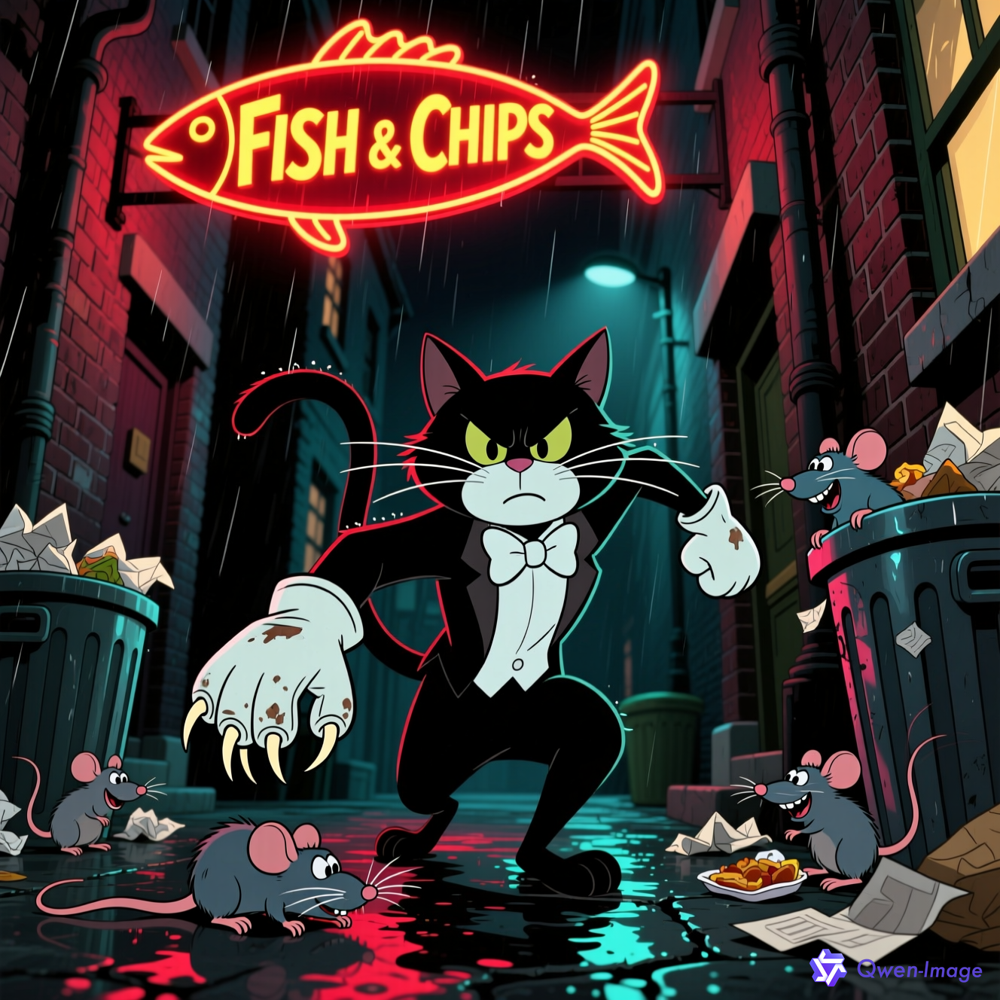

----------------------------------------------------------------------------------------
idiom:a cat in gloves catches no mice
infer: a cat among the pigeons
----------------------------------------------------------------------------------------
Cartoon night alley with overflowing trash cans and darting mice. A prim, well-groomed cat wears spotless white gloves and a tidy bow tie, poised to pounce but its padded gloves slip off a wriggling mouse. The cat frowns, staring at its trapped, retracted claws inside the gloves. Nearby, mice smirk and zip into cracks; a neon fishbone sign flickers overhead.
........................................................................................
false
• Emphasize the gloves actively blocking success: show thick, pristine mittens covering the cat’s paws so claws cannot extend; a mouse slipping away because the mitten can’t grip it.  
• Remove any cues of chaos/attacking multiple animals that suggest “cat among the pigeons”; keep only mice and m

In [148]:
i=7
IMAGE_PATH = "img/a.jpg"
Description = Idiom_2_LLM(i)
genImg = LLM_2_T2IM(Description, 'a.jpg')
inference = Image_2_Idiom(IMAGE_PATH,'gpt-5')
infer = inference.split(':')[-1]
is_correct = Validation(i,infer)
update_suggestions = suggestion(i,infer,'gpt-5',IMAGE_PATH)

print(Description)
print('.'*88)
print(is_correct)
print('='*88)
print(update_suggestions)

### 2) second iteration

a cat in gloves catches no mice


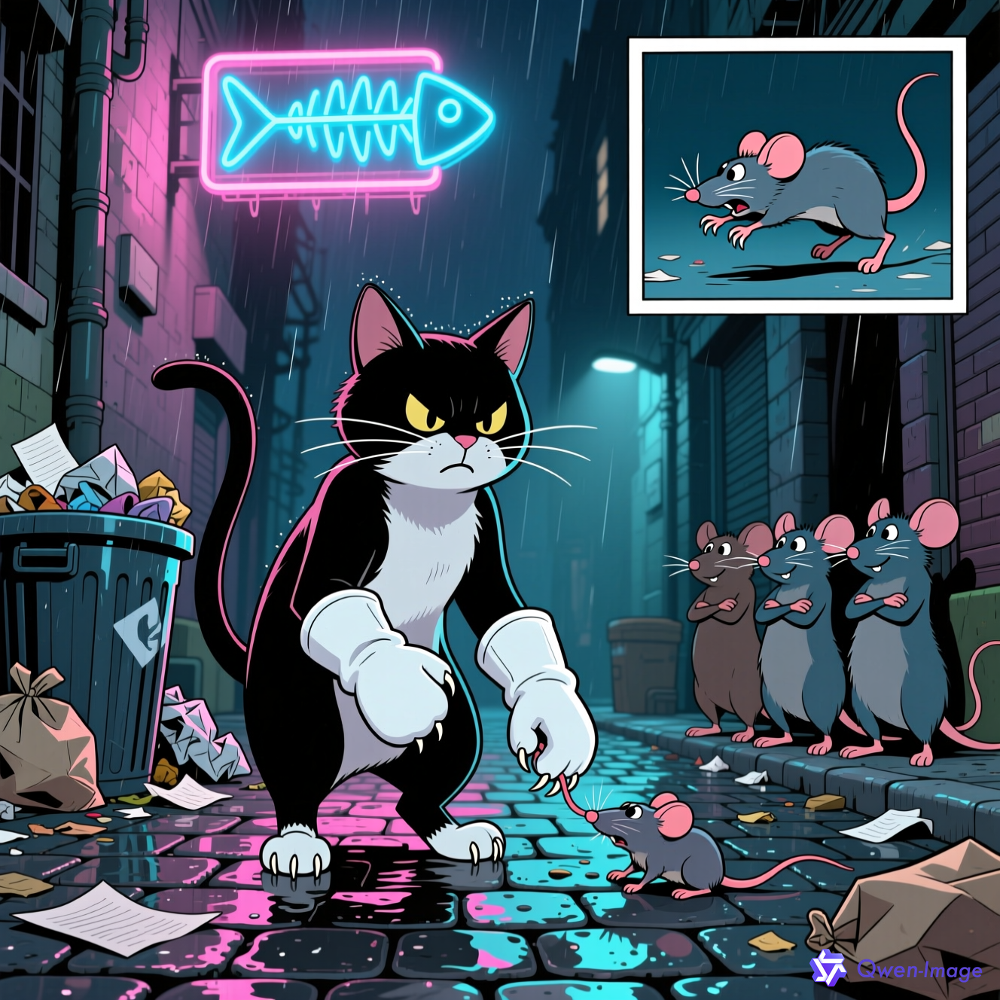

----------------------------------------------------------------------------------------
idiom:a cat in gloves catches no mice
infer: biting off more than you can chew
----------------------------------------------------------------------------------------
Cartoon night alley with overflowing trash cans and calm, watchful mice. A prim, well-groomed cat wears thick, pristine white mittens that fully cover its paws; tiny claw tips are visibly trapped inside. In the main panel, a mouse’s tail slips from the mittened paw, the cat grimacing as it can’t grip. The mice stand confidently nearby, arms folded, observing. In a small inset panel, the same cat bare-pawed extends sharp claws and cleanly snags a mouse, highlighting the contrast. A subtle neon fishbone sign flickers overhead.
........................................................................................
false
• Emphasize the “gloves cause failure” idea: show the cat’s mittens labeled “polite gloves” or “velvet gloves,” with 

In [149]:
i=7
previous = Description
IMAGE_PATH = "img/a.jpg"
Description = Idiom_2_LLM(i,previous,update_suggestions)
genImg = LLM_2_T2IM(Description, 'a.jpg')
inference = Image_2_Idiom(IMAGE_PATH,'gpt-5')
infer = inference.split(':')[-1]
is_correct = Validation(i,infer)
update_suggestions = suggestion(i,infer,'gpt-5',IMAGE_PATH)

print(Description)
print('.'*88)
print(is_correct)
print('='*88)
print(update_suggestions)

### 3) third iteration

a cat in gloves catches no mice


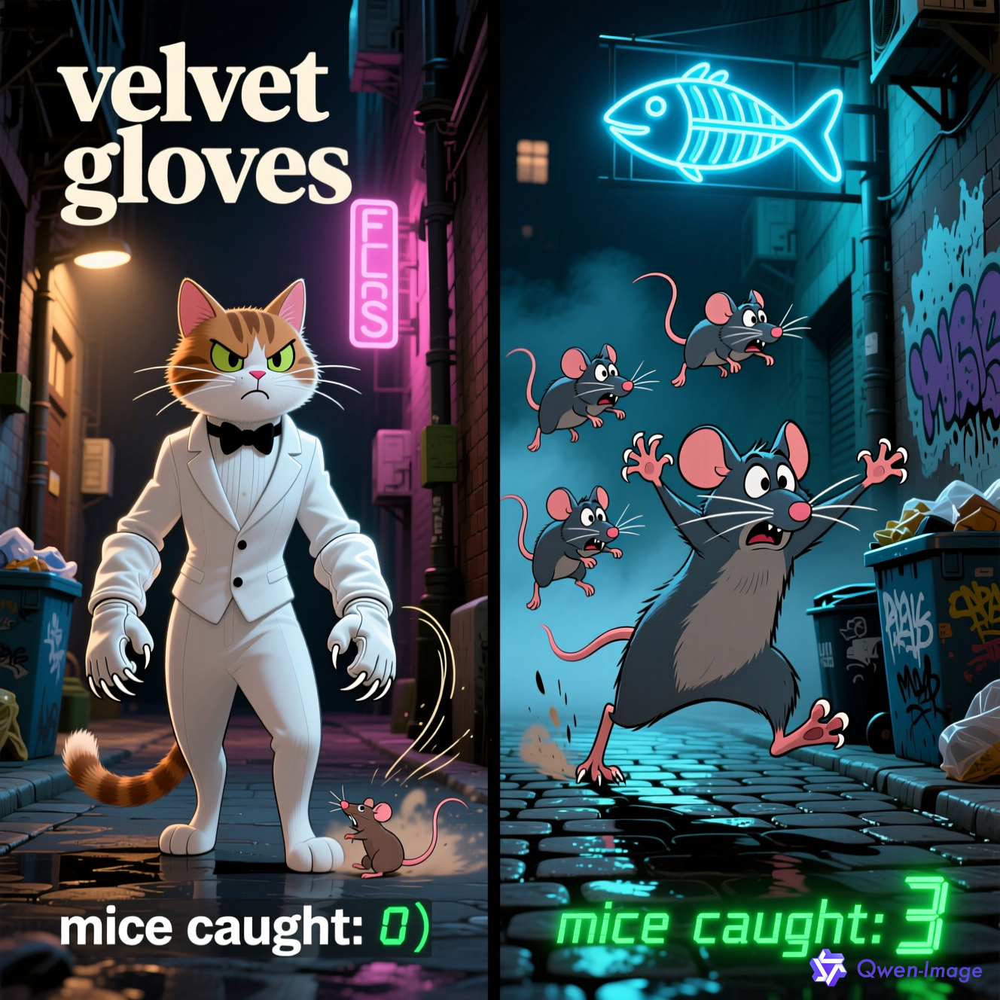

----------------------------------------------------------------------------------------
idiom:a cat in gloves catches no mice
infer: an iron fist in a velvet glove
----------------------------------------------------------------------------------------
Cartoon night alley with overflowing trash cans and calm, watchful mice. Split-panel layout: left panel labeled “with gloves” shows the prim, well-groomed cat wearing thick, pristine white mittens tagged “velvet gloves,” claw tips visibly trapped. Exaggerated slip marks as a mouse slides effortlessly out of the mittened grip; nearby tally reads “mice caught: 0.” Right panel labeled “no gloves” shows the same cat bare-pawed with extended claws, cleanly snagging multiple mice; tally reads “mice caught: 3.” The gloved cat grimaces in frustration while the bare-pawed version looks focused; a subtle neon fishbone sign flickers overhead.
........................................................................................
false
• Remove “v

In [150]:
i=7
previous = Description
IMAGE_PATH = "img/a.jpg"
Description = Idiom_2_LLM(i,previous,update_suggestions)
genImg = LLM_2_T2IM(Description, 'a.jpg')
inference = Image_2_Idiom(IMAGE_PATH,'gpt-5')
infer = inference.split(':')[-1]
is_correct = Validation(i,infer)
update_suggestions = suggestion(i,infer,'gpt-5',IMAGE_PATH)

print(Description)
print('.'*88)
print(is_correct)
print('='*88)
print(update_suggestions)

### 4) forth Iteration

a cat in gloves catches no mice


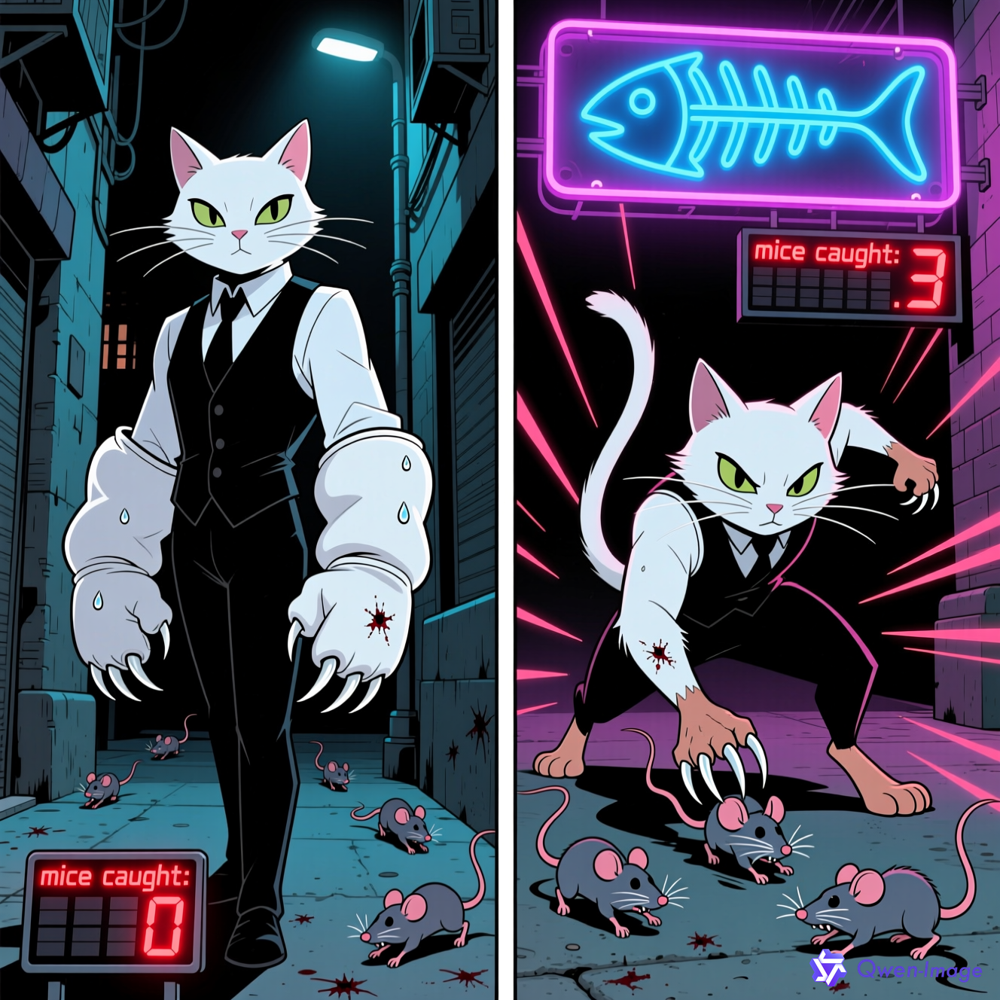

----------------------------------------------------------------------------------------
idiom:a cat in gloves catches no mice
infer: A cat in gloves catches no mice
----------------------------------------------------------------------------------------
Split-panel cartoon alley at night with overflowing trash cans and calm, watchful mice. Left panel “with gloves”: the same prim cat wears oversized padded white mittens that trap its claw tips; sweat beads on its brow. Close-up inset shows the mitten’s smooth fabric slipping off a squirming mouse, leaving it to dash away; multiple mice scurry past failed grab marks. A small scoreboard reads “mice caught: 0.” Right panel “no gloves”: the cat is bare-pawed with sharp claws fully extended, focused eyes. Action lines show swift swipes; one mouse is snagged by a claw with tiny puncture marks, two more pinned by outstretched claws. Scoreboard reads “mice caught: 3.” A flickering neon fishbone sign glows above both panels.
...................

In [152]:
i=7
previous = Description
IMAGE_PATH = "img/a.jpg"
Description = Idiom_2_LLM(i,previous,update_suggestions)
genImg = LLM_2_T2IM(Description, 'a.jpg')
inference = Image_2_Idiom(IMAGE_PATH,'gpt-5')
infer = inference.split(':')[-1]
is_correct = Validation(i,infer)
update_suggestions = suggestion(i,infer,'gpt-5',IMAGE_PATH)

print(Description)
print('.'*88)
print(is_correct)
print('='*88)
print(update_suggestions)

## (7) Iteration